In [1]:
%matplotlib inline
%config InlineBackend.figure_formats = ['svg']
from utils import *
from yolo import *
import torch
from torch import nn
import torchvision

In [2]:
train_iter, test_iter, test_iter_raw = load_data_voc(batch_size=16, test_shuffle=False)

In [3]:
# model_weight_path = './model/resnet18-pretrained-epoch-145.pth'
model_weight_path = './model/1682994688191331000-epoch-120.pth'

resnet18 = torchvision.models.resnet18(pretrained=True)
backbone = nn.Sequential(*list(resnet18.children())[:-2]) # remove avg pool and fc
net = yolo.Yolo(backbone, backbone_out_channels=512)

net.load_state_dict(torch.load(model_weight_path))

c:\Users\Edward\AppData\Local\Programs\Python\Python39\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
c:\Users\Edward\AppData\Local\Programs\Python\Python39\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


<All keys matched successfully>

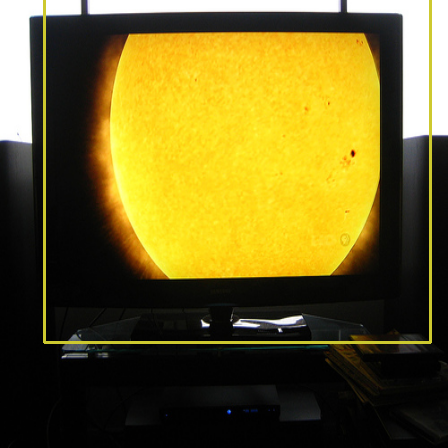

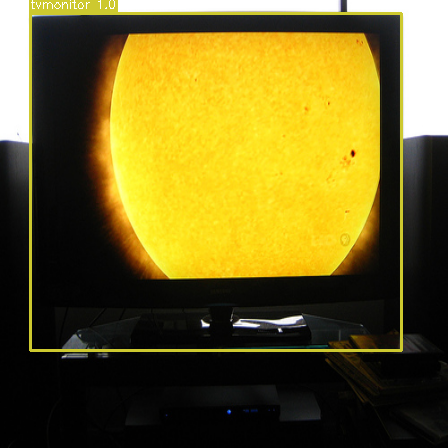

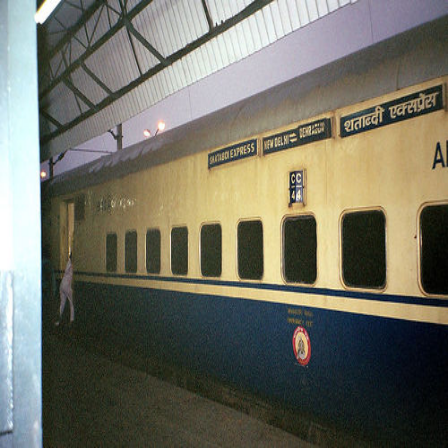

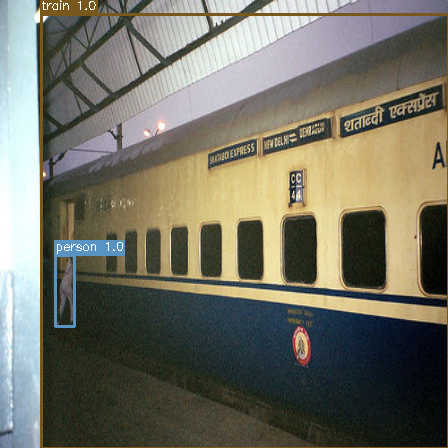

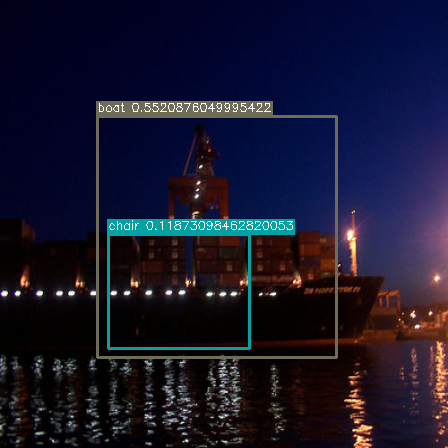

...

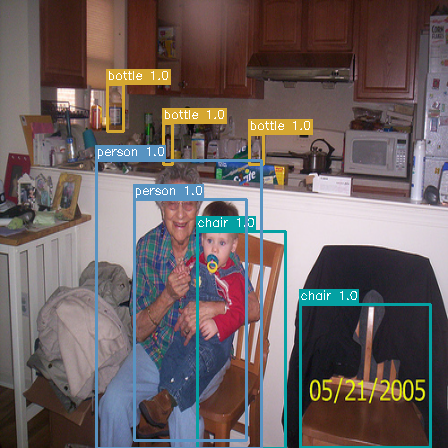

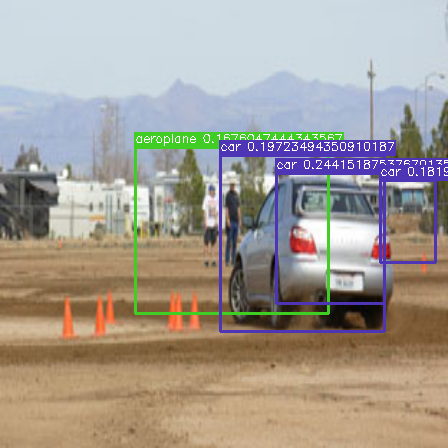

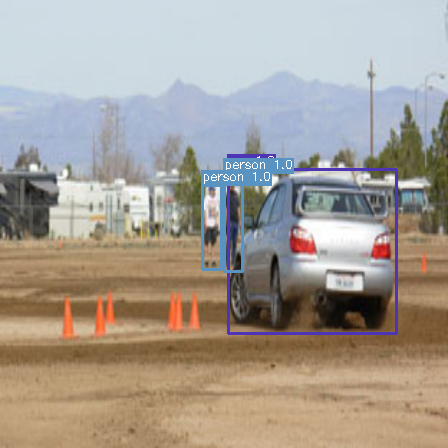

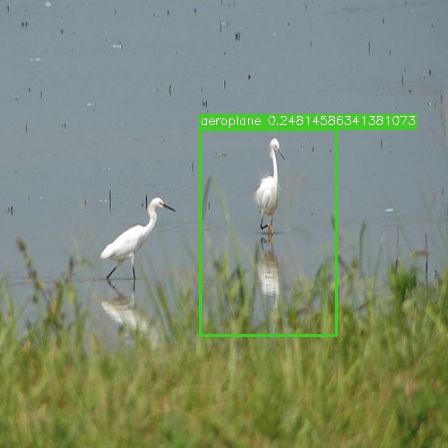

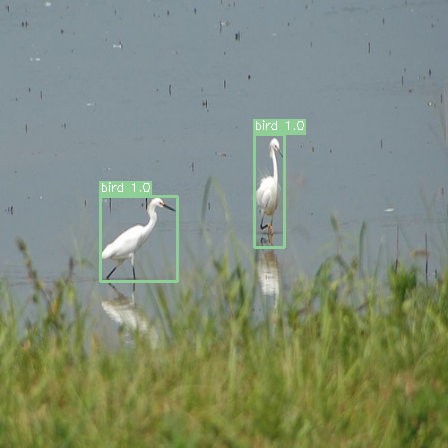

In [4]:
test_one_batch(net, test_iter_raw, 'cuda')

In [5]:
test_fps(net, test_iter_raw, 'cuda')

FPS: 95.10511995153172


Batch 0 / 364
Batch 1 / 364
Batch 2 / 364
Batch 3 / 364
Batch 4 / 364
Batch 5 / 364
Batch 6 / 364
Batch 7 / 364
Batch 8 / 364
Batch 9 / 364
Batch 10 / 364
Batch 11 / 364
Batch 12 / 364
Batch 13 / 364
Batch 14 / 364
Batch 15 / 364
Batch 16 / 364
Batch 17 / 364
Batch 18 / 364
Batch 19 / 364
Batch 20 / 364
Batch 21 / 364
Batch 22 / 364
Batch 23 / 364
Batch 24 / 364
Batch 25 / 364
Batch 26 / 364
Batch 27 / 364
Batch 28 / 364
Batch 29 / 364
Batch 30 / 364
Batch 31 / 364
Batch 32 / 364
Batch 33 / 364
Batch 34 / 364
Batch 35 / 364
Batch 36 / 364
Batch 37 / 364
Batch 38 / 364
Batch 39 / 364
Batch 40 / 364
Batch 41 / 364
Batch 42 / 364
Batch 43 / 364
Batch 44 / 364
Batch 45 / 364
Batch 46 / 364
Batch 47 / 364
Batch 48 / 364
Batch 49 / 364
Batch 50 / 364
Batch 51 / 364
Batch 52 / 364
Batch 53 / 364
Batch 54 / 364
Batch 55 / 364
Batch 56 / 364
Batch 57 / 364
Batch 58 / 364
Batch 59 / 364
Batch 60 / 364
Batch 61 / 364
Batch 62 / 364
Batch 63 / 364
Batch 64 / 364
Batch 65 / 364
Batch 66 / 364
Batch

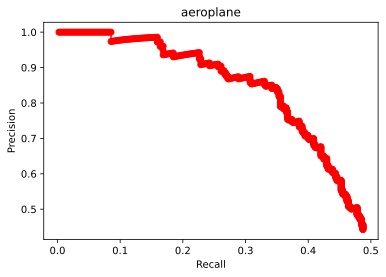

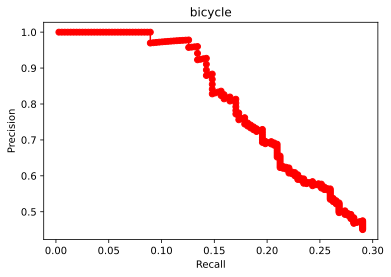

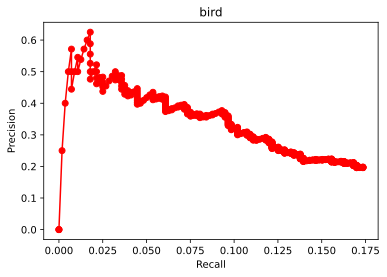

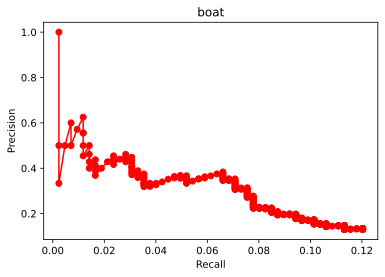

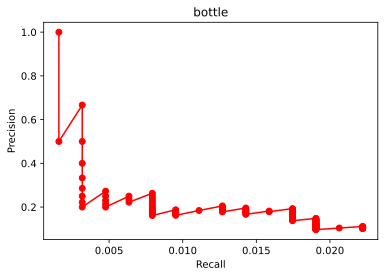

...

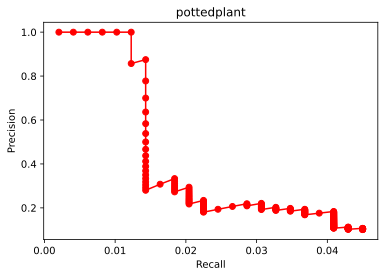

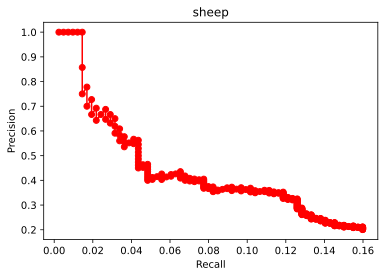

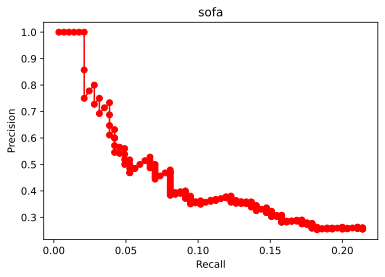

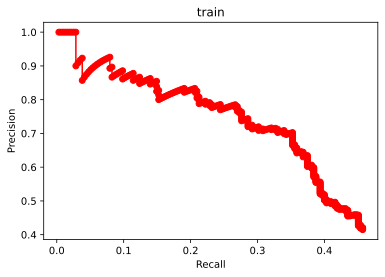

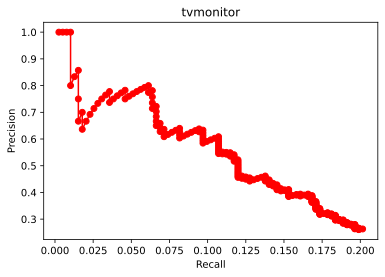

In [6]:
test_and_draw_mAP(net, test_iter_raw, 'cuda')